#Chapter5

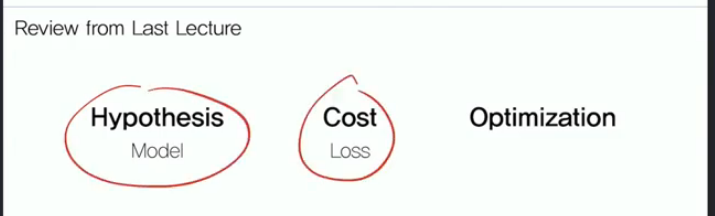

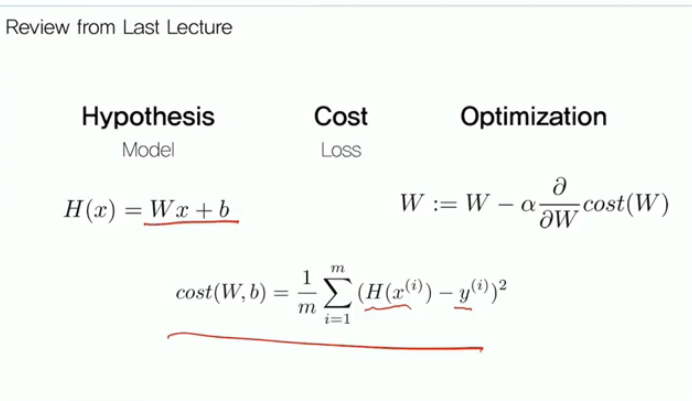

Cost를 편미분 Gradient를 반대방향으로 업데이트한다.  

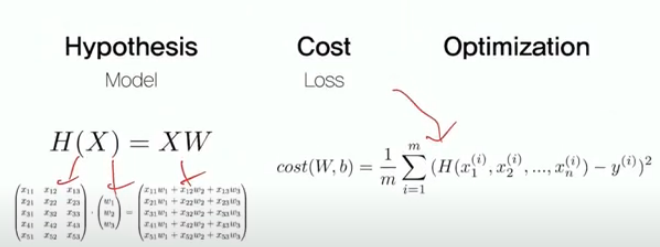

입력이 2차원인 데이터를 만들 예정이다. 
<br>한 쪽은 log함수, 다른쪽은 cos, sin함수이다.
<br>보이지 않은 데이터를 분류하고 예측

데이터 준비, 모델 만들기(MLP), 손실함수 만들기, 예측수행, (Report보고서 만들기 Loss와 matric을 볼 예정) 

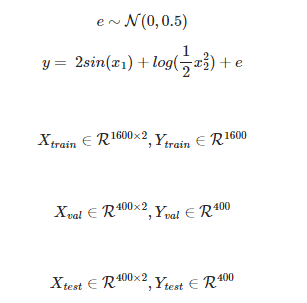

1.데이터를 생성
<br>x1, x2가 가상의 분포이다. 2sin+log(1/2x^2)+e(잡음)의 식으로 구성되어 있다.

x1의 최솟값과 최댓값: 0.002972313989003661 9.998230998304798
e의 평균: 0.0 e의 분산: 0.4998820568719046


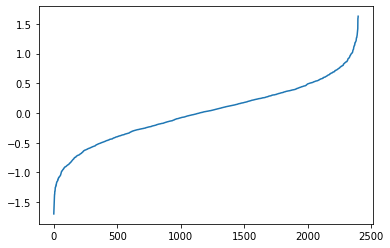

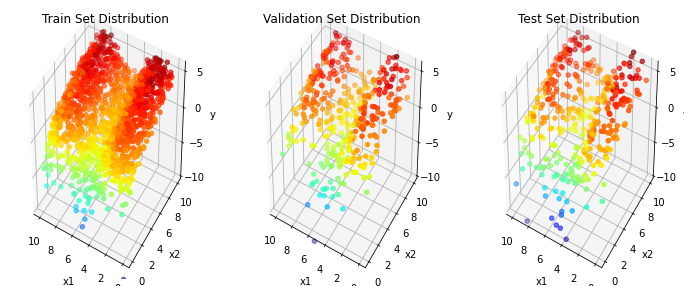

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

num_data = 2400 #데이터의 수는 2400개
x1 = np.random.rand(num_data) * 10 #x1은 *10을 함으로써 0부터 10까지의 랜덤 숫자를 총 2400개를 균일하게 생성한다. 
print("x1의 최솟값과 최댓값:",x1.min(), x1.max())
x2 = np.random.rand(num_data) * 10 #np.random.rand(데이터의 갯수) * 크기 (크기 설정 안하면 0부터 1까지 균등한 분포)
e = np.random.normal(0, 0.5, num_data) #잡음은 가우시안 분포(정규분포)를 이용하여 평균은 0, 표준편자는 0.5인 난수 생성
print("e의 평균:",np.round(e.mean()), "e의 분산:", e.std())
plt.plot(np.sort(e))#np.sort(e)로 np.array의 크기정렬을 하였으며 가우시안 분포를띄는걸 볼 수 있다. 
X = np.array([x1, x2]).T #x1과 x2를 눕히고 싶어서 2*2400에서 2400*2가 된다. 
y = 2*np.sin(x1) + np.log(0.5 * x2 **2) + e
#훈련, 검증 데이터를 나누기
train_X, train_y = X[:1600, :], y[:1600] #2400*2인데 [:1600, :]는 x1과 x2가 쌍으로 1600개까지 train_data
val_X, val_y = X[1600:2000, :], y[1600: 2000] #1600qnxj 2000은 validation
test_X, test_y = X[2000:, :], y[2000:] 

#그래프 시각화
#그래프를 그리는 방법: 1. plt.plot(그래프를 1개 그릴 때)
#2.여러개를 그리고 싶으면 fig를 지정 fig = plt.subplot(figsize = (, ))
#3. subplot은 figure에 들어가는 작은 그림이다. add_subplot(1, 3, 1), add_subplot(1, 3, 2), add_subplot(1, 3, 3)
#subplot을 행은 1개 열은 총 3개 그리기 projection = '3d' 3d를 그리기
fig = plt.figure(figsize=(12, 5))
ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
ax1.scatter(train_X[:,0], train_X[:,1], train_y, c=train_y, cmap = 'jet')#X[0]은 x1. X[1]은 x2이다.

ax1.set_xlabel('x1')
ax1.set_ylabel('x2')
ax1.set_zlabel('y')
ax1.set_title('Train Set Distribution')
ax1.set_zlim(-10, 6)
ax1.view_init(40, -60)
ax1.invert_xaxis()

ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax2.scatter(val_X[:, 0], val_X[:, 1], val_y, c=val_y, cmap='jet')

ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.set_zlabel('y')
ax2.set_title('Validation Set Distribution')
ax2.set_zlim(-10, 6)
ax2.view_init(40, -60)
ax2.invert_xaxis()

ax3 = fig.add_subplot(1, 3, 3, projection='3d')
ax3.scatter(test_X[:, 0], test_X[:, 1], test_y, c=test_y, cmap='jet')

ax3.set_xlabel('x1')
ax3.set_ylabel('x2')
ax3.set_zlabel('y')
ax3.set_title('Test Set Distribution')
ax3.set_zlim(-10, 6)
ax3.view_init(40, -60)
ax3.invert_xaxis()

plt.show()



코드메모: 
<br>3D그래프 그릴때: from mpl_toolkits import mplot3d이용
<br>1. fig = plt.figure(figsize = ()) 피규어 지정
2. plt.add_subplot(1, 3, 1, projection = '3d')
<br>총 3개를 그릴 것이며, 3d그래프를 그릴 것이다. 
3. plt.scatter(x1, x2, y, c=y, cmap = 'jet')
<br>x1, x2, y값, 색깔, 색깔변화(colorbar) (산점도)
<br>cmap은 rainbow등등, 색조화가 다르다. 
<br>np.random.rand(개수) * 크기 
<br>0부터 1까지의 난수가 0부터 크기만큼으로 난수개수로 바뀜. 
4. ax1.set_xlabel,set_ylabel, set_zlabel
<br>ax1.set_title
<br>ax1.set_xlim(), set_ylim(), set_zlim()
<br>라벨설정, 제목설정, 경계설정 
5. ax1.view_init()
ax1.invert_xaxis():x축 바꾸기등등

<br>np.random.normal(평균, 표준편차, 데이터 개수) 가우스 분포를 따르며 데이터의 개수만큼 난수를 생성

<br>np.sort()로 np.array의 크기를 정렬 가능 

<br>np.max() np.min() mp.mean() np.std()
<br>최대     최소     평균      표준편차

<br>X.T는 X의 전치 행렬을 뜻한다. 
1. x1 = np.array(2400개) 
2. x2 = np.array(2400개) 
3. np.array([x1, x2])의 형태는? 2*2400으로 세로 벡터가 되어 저장된다. 

<br>train_x, train_y = X[:1600, :], y[:1600]
<br>행은 1600까지, 열은 x1, x2가 모두 나와야해서 전체를 슬라이싱, y는 1차원이라서 1600까지 슬라이싱 

만약 회차를 거듭할 수록, validation 오차가 증가한다면?오버피팅이 발생했다.

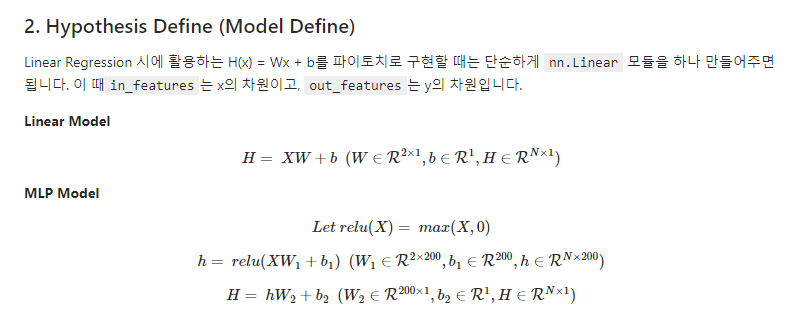

W는 2차원이다.x와 곱해서 1차원으로 바꾼다. b는 1차원으로 더해진다(bias) . 

2.모델을 정의

In [ ]:
import torch
import torch.nn as nn

class LinearModel(nn.Module): #nn.Module에서 가져와서 LinearModel을 형성
  def __init__(self): #hypothesis 한번 수행하는 곳. 
     super(LinearModel, self).__init__()
     self.linear = nn.Linear(2, 1, bias = True) #input_features, output_features, bias가 생성
     
  
  def forward(self, x): #x가 여기로 들어가서 W와 연산을 수행.
    x = torch.flatten(input_dim =1)
    return self.linear(x)
  
lm = LinearModel() #캡슐화
print(lm.parameters, lm.linear.weight, lm.linear.bias)
#파라미터를 직접 볼 수 있다. 



<bound method Module.parameters of LinearModel(
  (linear): Linear(in_features=2, out_features=1, bias=True)
)> Parameter containing:
tensor([[-0.1527,  0.4309]], requires_grad=True) Parameter containing:
tensor([-0.2857], requires_grad=True)


class 모델이름 (nn.Module):  
  def __init__(self): 무조건 한번 실행해야함  
    super(모델이름, self).__init__()  
    self.linear1 = nn.Linear(입력, 출력, bias = True)  
    self.batch1 = nn.Batchnorm1d(출력)  
    self.relu = nn.ReLU()  
    (self.softmax = nn.Softmax())        
    (nn.Tanh()도 있다. RNN에 사용)       
    self.conv2 = nn.Conv2d(입력층, 출력층, 가로 세로크기, stride = 2 )  
    self.batch2 = nn.BatchNorm2d(출력의 층수)    
    self.max2 = n.MaxPool2d((height, width), stride = 2)    
    이런식으로 다양한 함수를 지정  

  def forward(self, 입력):  #전방계산을 정의 입력이 어떻게 통과할 지 정한다.   
  x = self.conv2(입력)  
  x = self.batch2(x)  
  x = self.relu(x)  
  x = torch.flatten(input_dim = 1)  #flatten할 때 배치는 건들지 않도록 꼭 input_dim =1 설정  
  x = self.linear1(x)  
  x = F.relu(self.batch1(x))  #이런 식으로도 relu사용 가능  
  return x  


그외 import torch.nn.functional as F  
return F.log_softmax(x, dim =1)  

+한 줄을 다 쓰고나서 띄어쓰기를 2번하면 줄바꿈을 할 수 있다.  



3.Loss_function구현

In [ ]:
reg_loss = nn.MSELoss()

predicted = torch.Tensor([0, 0, 0, 0])
labels = torch.Tensor([1, 0, 0, 0])
print(reg_loss(predicted, labels))
#기준 변수를 설정 
#기준(예측값, 정답값)에서 오차가 나온다. 

tensor(0.2500)


criterion = nn.MSELoss()  #목적함수를 정의 평균제곱 오차함수를 상속받았다.  
보통 쓰는 loss들   
nn.BCELoss()  이진분류 크로스엔트로피  
nn.CrossEntropyLoss()  다중분류 크로스엔트로피  
nn.NLLLoss()  로그우도 return F.log_softmax(x, dim = 1)을 해야한다. 




model = 모델이름()  #캡슐화    
import torch.optim as optim    
lr = 0.0001 #learning_rate설정    
optimizer = optim.SGD(model.parameters, lr = lr)  #최적화하는 함수 설정, 학습속도  
(eps도 설정가능, 여기에 weight_decay를 사용해 L2 norm이 사용 가능하다)   
optim.Adam()  
optim.Adagrad()  
optim.RMSprop()  

4.학습 및 평가

1. 리스트 만들기  
epoch리스트, train_loss, val_loss, accuracy리스트 만들기    

2. 학습하기
for i in range(epoch):    
model.train()  
train_x, true_y설정 torch.Tensor(데이터), torch.Tensor(라벨)  
predicted = model(train_x) 데이터를 모델에 넣어 학습  
loss = criterion(predicted, train_y)  #loss 구하기 무조건!!   
loss(예측값, 정답값)순서 지키기!
loss.backward()  #오류역전파  
opitmizer.step()  #오류역전파를 토대로 파라미터를 수정   

3. model.eval()은 검증을 위해 사용한다.  
단순히 loss만 계산하여 리스트에 append 하면된다.     





그외)  
squeeze() 차원을 맞춰주기위해 1인 차원제거   
unsqueeze(위치) 이건 원하는 위치에 차원 1 추가   
2차원이였다면 앞에 1추가해서 3차원이 된다.       

detach().numpy()  
gradient 연산에서 분리후 넘파이로 바꾸기   
그냥 .item()을 써도 된다!  (얘는 연산에서 분리후 그냥 scalar로 만들어버림)   



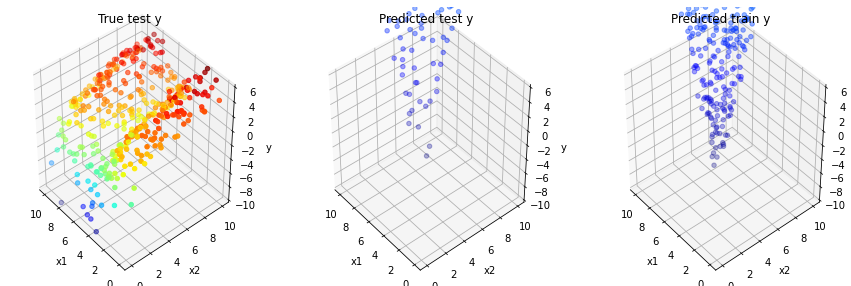

0 tensor(1916.1450, grad_fn=<MseLossBackward0>)


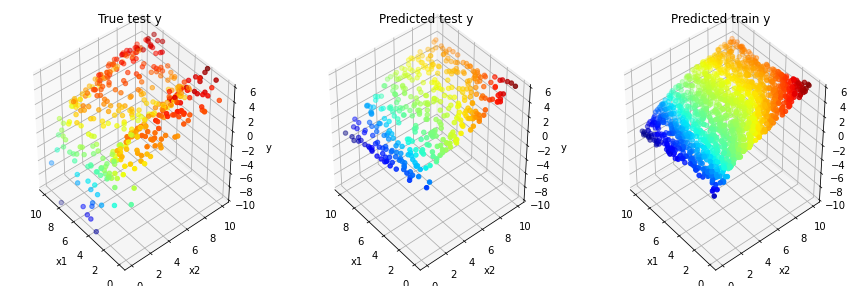

200 tensor(2.8106, grad_fn=<MseLossBackward0>)


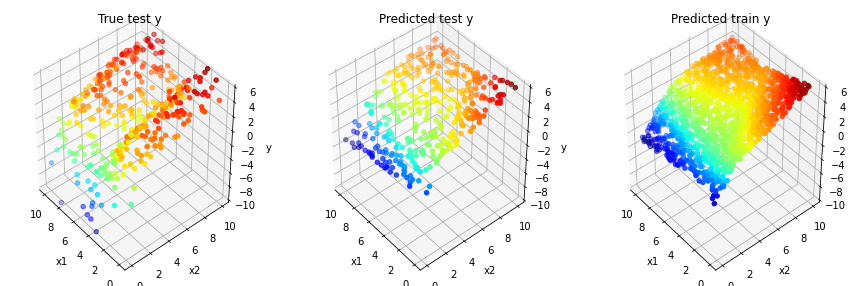

400 tensor(2.3873, grad_fn=<MseLossBackward0>)


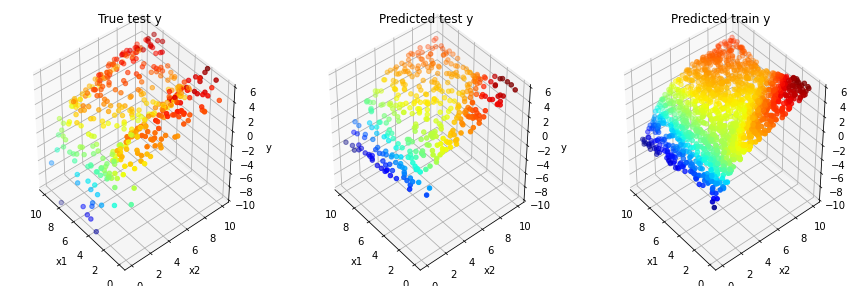

600 tensor(2.1696, grad_fn=<MseLossBackward0>)


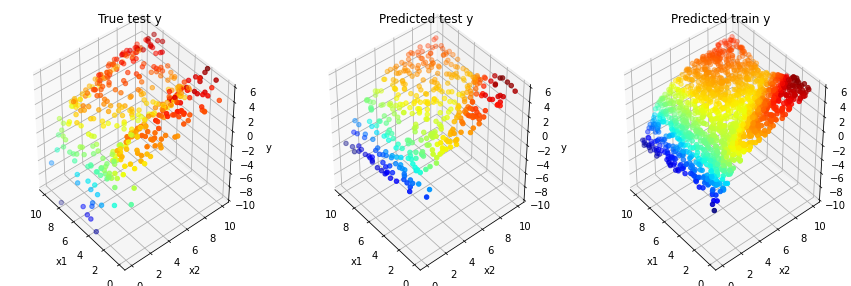

800 tensor(2.0346, grad_fn=<MseLossBackward0>)


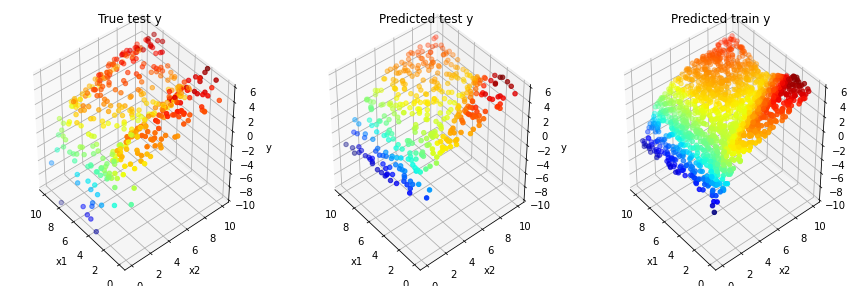

1000 tensor(1.9120, grad_fn=<MseLossBackward0>)


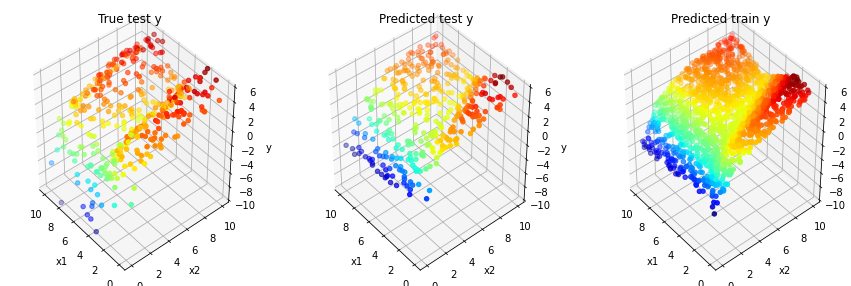

1200 tensor(1.8130, grad_fn=<MseLossBackward0>)


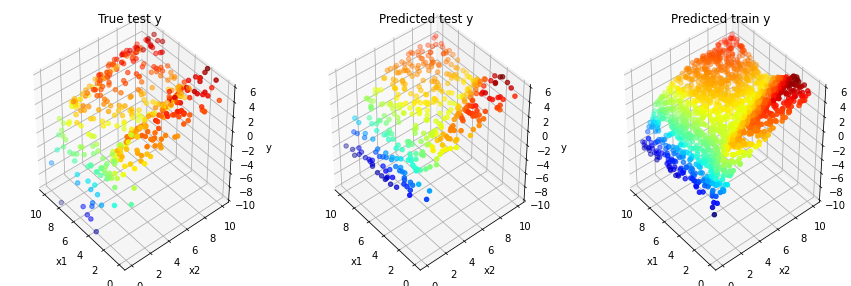

1400 tensor(1.7218, grad_fn=<MseLossBackward0>)


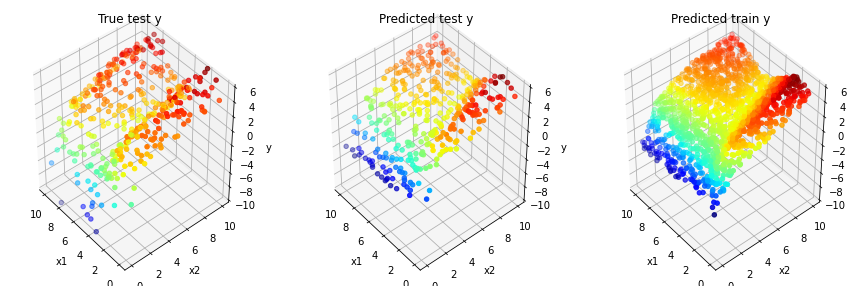

1600 tensor(1.6383, grad_fn=<MseLossBackward0>)


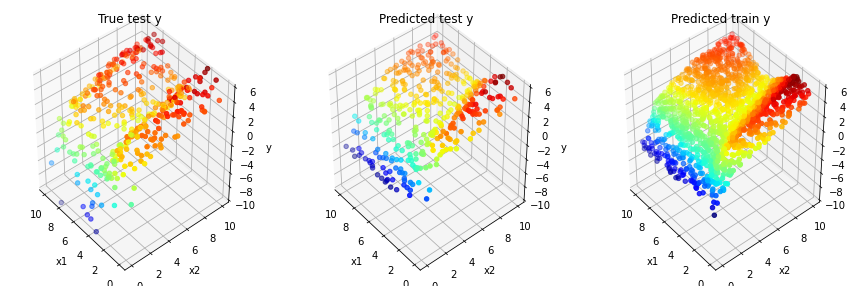

1800 tensor(1.5652, grad_fn=<MseLossBackward0>)


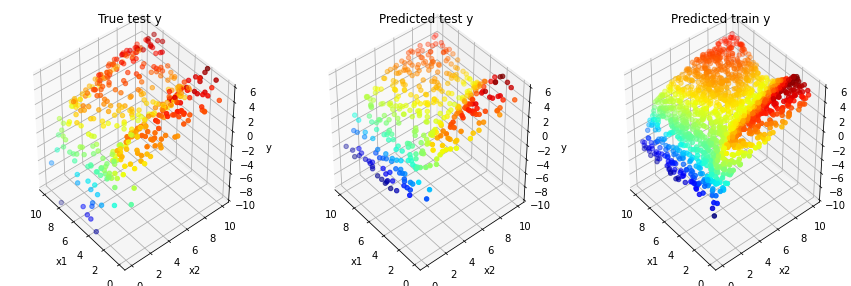

2000 tensor(1.5005, grad_fn=<MseLossBackward0>)


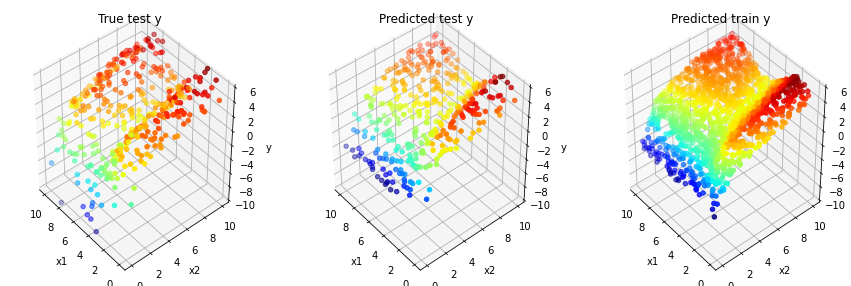

2200 tensor(1.4441, grad_fn=<MseLossBackward0>)


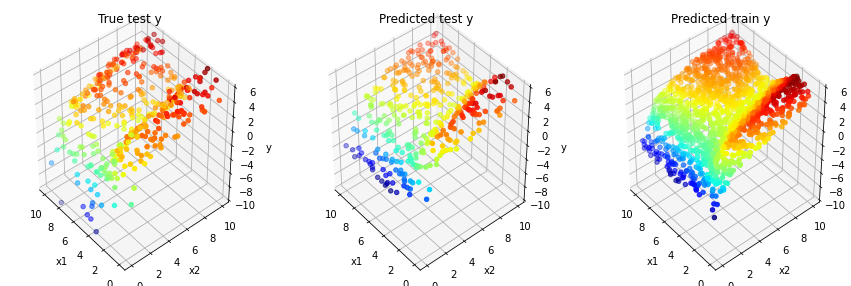

2400 tensor(1.3826, grad_fn=<MseLossBackward0>)


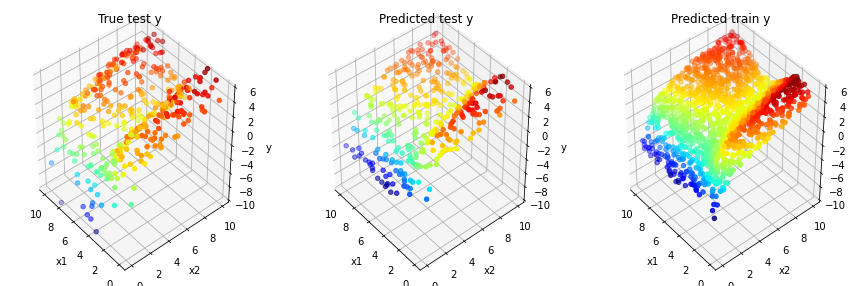

2600 tensor(1.3339, grad_fn=<MseLossBackward0>)


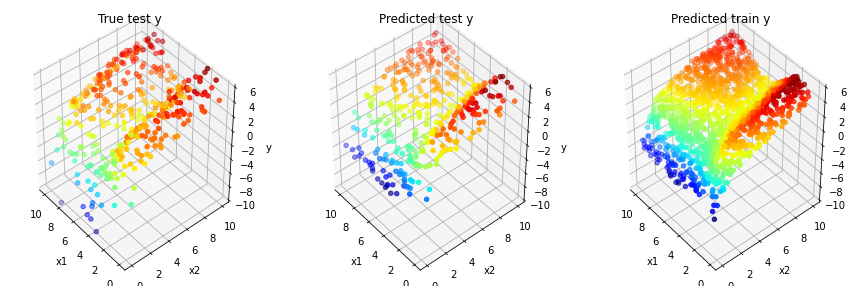

2800 tensor(1.2950, grad_fn=<MseLossBackward0>)


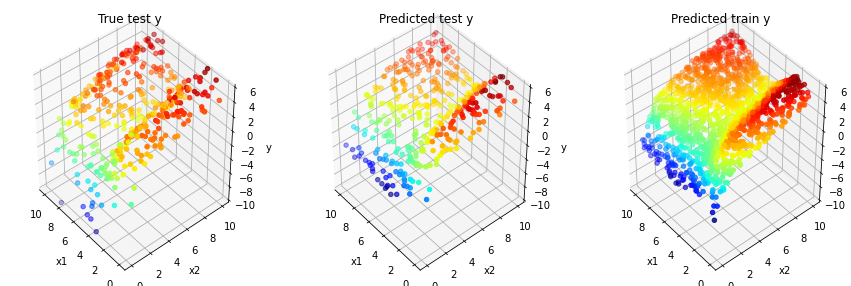

3000 tensor(1.2609, grad_fn=<MseLossBackward0>)


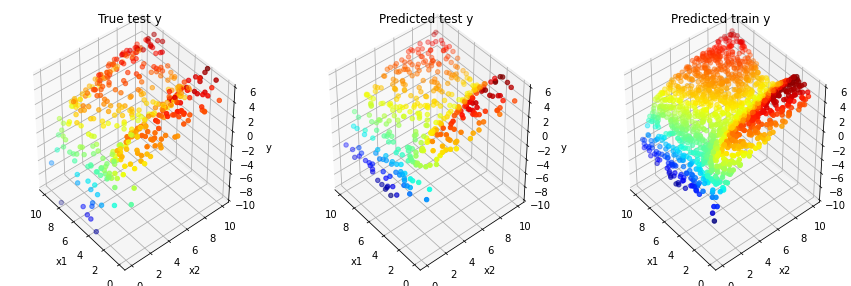

3200 tensor(1.2274, grad_fn=<MseLossBackward0>)


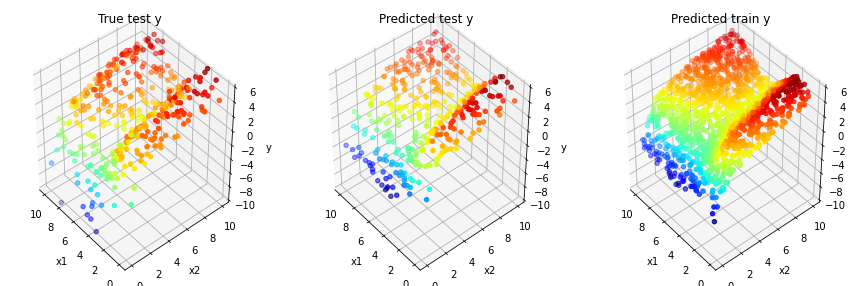

3400 tensor(1.1764, grad_fn=<MseLossBackward0>)


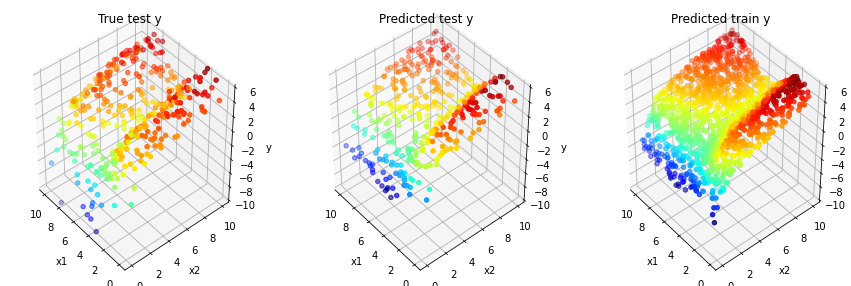

3600 tensor(1.1481, grad_fn=<MseLossBackward0>)


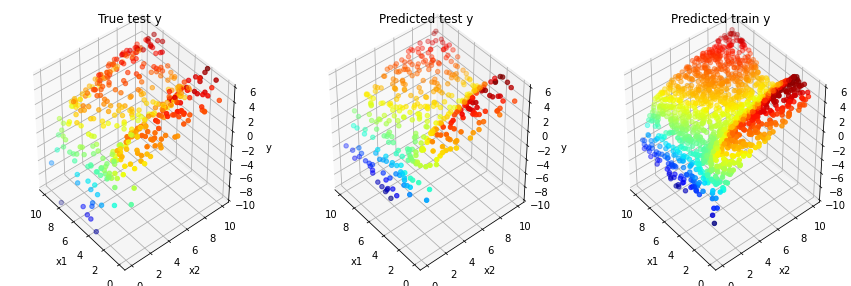

3800 tensor(1.1244, grad_fn=<MseLossBackward0>)


In [ ]:
import torch.optim as optim
from sklearn.metrics import mean_absolute_error

lr = 0.005
model = MLPModel() #캡슐화
optimizer = optim.SGD(model.parameters(), lr = lr) #learning_rate를 설정

#epoch는 주어진 데이터를 몇번 보여줄지 결정
list_epoch = []
list_train_loss = []
list_val_loss = []
list_mae = []
list_mae_epoch = []

epoch = 4000 #iteration과 헷갈릴 수 있음 iteration은 파라미터가 한번 업데이트 되는 횟수.
#iteration은 10만개의 데이터를 한번에 training을 할 수 없어서 100개의 배치로 나눠서 훈련을 시킨다.
#이걸로 gradient구하고 iteration을 한다. 
#ieration은 batch_size마다 발생, epoch는 데이터의 전체를 보고 업데이트한다. 
#배치와 미니배치는 차이가 거의 없다.

#===============학습================
for i in range(epoch):
  model.train() #이걸 해줘야 training을 한다. evaluation일 때는 model.eval()을 사용 모드를 결정
  optimizer.zero_grad() #연산 그래프를 초가화 안그러면 연산이 누적되어서 발산 

  input_x = torch.Tensor(train_X)  #np.array, torch.Tensor()
  true_y = torch.Tensor(train_y)   #파이토치로 연산하려면 무조건 입력데이터 텐서로 바꾸기
  pred_y = model(input_x) #model에 input_x를넣으면 된다. 이때 결과값의 형태가 (1600, 1)이다! 엥 true_y는 (1600,)인데?
  loss = reg_loss(pred_y.squeeze(), true_y) #이래서 예측값에서 pred_y.squeeze()를 통해 불필요한 1인 차원을 없앤다.
  loss.backward()    #.squeeze()안하면 학습이 안될 수 있다!! 그리고 gradient알아서 계산한다. 
  optimizer.step()  
  list_epoch.append(i)
  list_train_loss.append(loss.detach().numpy()) #loss값에서 gradient값을 신경 안쓰고 loss라는 순수한 숫자를 원할때 사용
  #loss.item()사용해도 된다.!!!!!

#===============검증================
  model.eval()
  optimizer.zero_grad()
  input_x = torch.Tensor(val_X)
  true_y = torch.Tensor(val_y)
  pred_y = model(input_x)
  loss = reg_loss(pred_y.squeeze(), true_y)
  list_val_loss.append(loss.item())

#=============시험=============
  if i % 200 == 0: #200회의 학습마다 모델이 예측한 분포 그리기
    model.eval()
    optimizer.zero_grad()
    input_x = torch.Tensor(test_X)
    true_y = torch.Tensor(test_y)
    pred_y = model(input_x).detach().numpy()
    mae = mean_absolute_error(true_y, pred_y)
    list_mae.append(mae)
    list_mae_epoch.append(i)

    #그림그리기 
    #test_dataset그리기
    fig = plt.figure(figsize = (15, 5))
    ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
    ax1.scatter(test_X[:, 0], test_X[:, 1], test_y, c = test_y, cmap = 'jet')

    ax1.set_xlabel('x1')
    ax1.set_ylabel('x2')
    ax1.set_zlabel('y')
    
    ax1.set_zlim(-10, 6)
    ax1.view_init(40, -40)
    ax1.set_title('True test y')
    ax1.invert_xaxis()

    #예측 그리기

    ax2 = fig.add_subplot(1, 3, 2, projection = '3d')
    ax2.scatter(test_X[:, 0], test_X[:, 1], pred_y,  c=pred_y[:,0], cmap='jet')
    ax2.set_xlabel('x1')
    ax2.set_ylabel('x2')
    ax2.set_zlabel('y')
    ax2.set_zlim(-10, 6)
    ax2.view_init(40, -40)
    ax2.set_title('Predicted test y')
    ax2.invert_xaxis()

    input_x = torch.Tensor(train_X)
    pred_y = model(input_x).detach().numpy() 
    pred_y = pred_y.squeeze()
    ax3 = fig.add_subplot(1, 3, 3, projection='3d')
    ax3.scatter(train_X[:, 0], train_X[:, 1], pred_y, c=pred_y, cmap='jet')

    ax3.set_xlabel('x1')
    ax3.set_ylabel('x2')
    ax3.set_zlabel('y')
    ax3.set_zlim(-10, 6)
    ax3.view_init(40, -40)
    ax3.set_title('Predicted train y')
    ax3.invert_xaxis()
        
    plt.show()
    print(i, loss)








5. Report하기

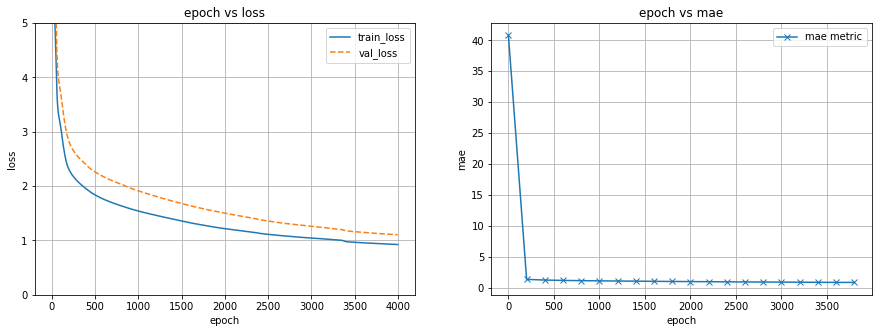

In [ ]:
fig = plt.figure(figsize = (15, 5))
ax1 = fig.add_subplot(1, 2, 1)
ax1.plot(list_epoch, list_train_loss, label='train_loss')
ax1.plot(list_epoch, list_val_loss, '--', label='val_loss')
ax1.set_xlabel('epoch')
ax1.set_ylabel('loss')
ax1.set_ylim(0, 5)
ax1.grid(True)
ax1.legend()
ax1.set_title('epoch vs loss')

#metric function으로 그려보기

ax2 = fig.add_subplot(1, 2, 2)
ax2.plot(list_mae_epoch, list_mae, marker='x', label='mae metric')

ax2.set_xlabel('epoch')
ax2.set_ylabel('mae')
ax2.grid()
ax2.legend()
ax2.set_title('epoch vs mae')


plt.show()





#Chapter6

Binary Classification 
<br>supervised learning
<br>discrete vs continuous 

<br>classification problem을 머신러닝으로 해결 
<br>binary classification
<br>수학적으로 나타내기 0과 1에 대응
<br>Hypothesis
<br>Binary classification
<br>시험 pass? fail?
공부시간이 적으면 실패, 공부시간이 많으면 성공
<br>Linear regression이 가능?

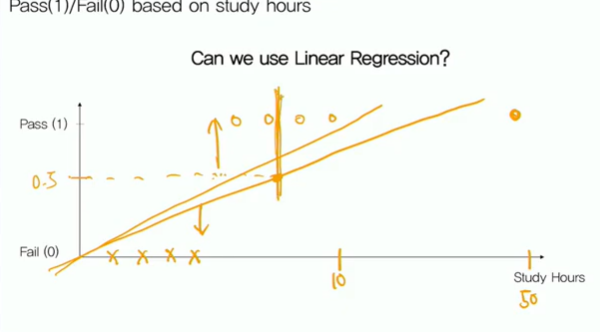

Linear Rgeression을 잘 분류했다가 멀리떨어진 데이터에 의해 
선이 따라가면서 오분류가 된다. continuous가 output?
Linear Regression을 그대로 가져오기 뭐시기함.

Linear Regression에다가 어떤 적절한 조칠르 취할까?
SIgmoid Function을 활용!! 
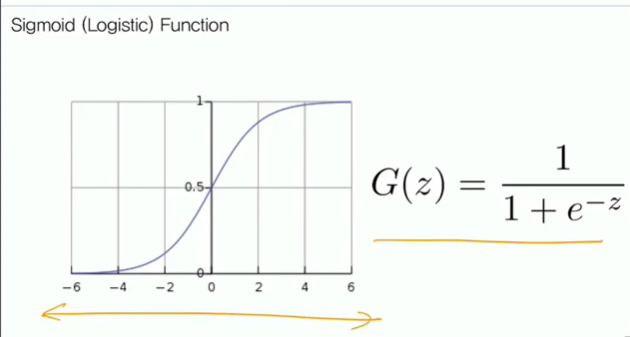

G라는 함수가 무한으로 가면 1, -무한으로 가면 0이 된다. sigma랑 닮아서 시그모이드이다. 

새로운 이론!

$$H(X)=\frac{1}{1+e^{-WX}}$$

새로운 Cost를 정의한다. 
<br>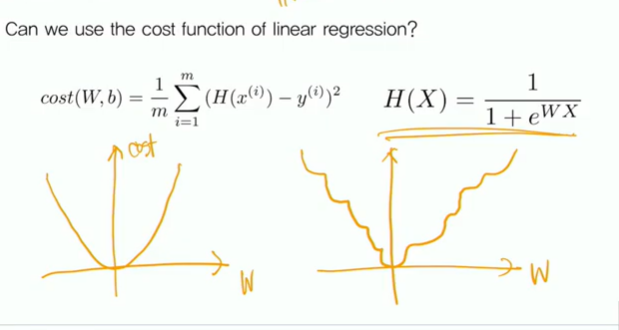

기존 오차 함수를 정의하면 saddle point가 너무나 많아서 학습하다가 매개변수가 이상한 곳에 자꾸 멈춘다.

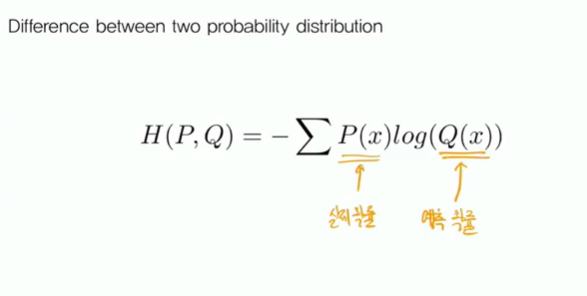

엔트로피: 한 시스템이 얼마나 불안정할 것인가?
<br>P(x)는 실제 확률이다. Q(x)는 예측한 확률이다. 


얼마나 예측을 못하는가에 따라 값이 커진다. 
<br>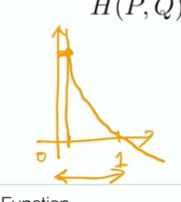

Q(x)가 예측을 못할수록 뒤로 커진다.

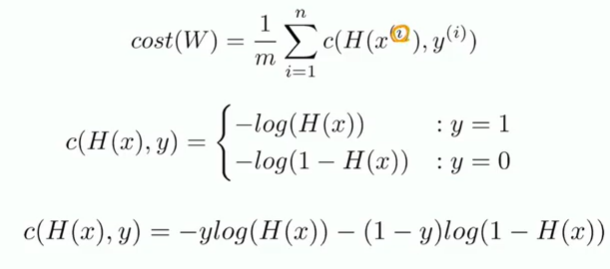

i는 각 데이터 
<br>y가 1인경우: -log(H(x))       y가 0인 부분: -log(1-H(x))
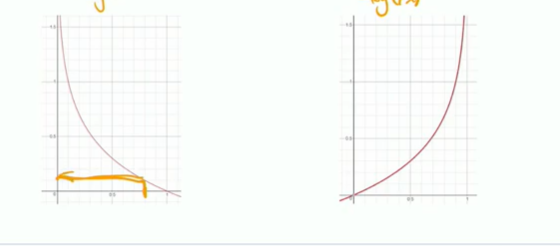



y가 1인 부분은 예측한 확률이 1에 가까워야 처벌이 적으며, y가 0인 부분은 예측 확률을 0과 가깝게 해야 피해를 최소화할 수 있다.

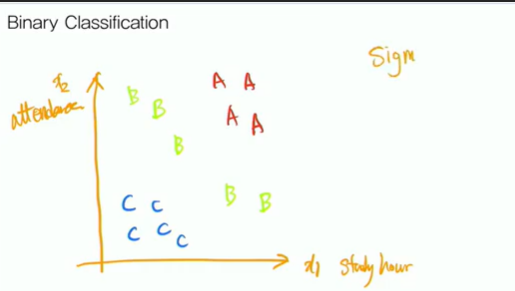

시그모이드: 1대1대응 
<br> 출석과 공부시간을 다뤄야해서 w가 2개가 등장 
<br>w1x1 + w2x2 + b = 0
<br>input이 2개라 평면이다. 

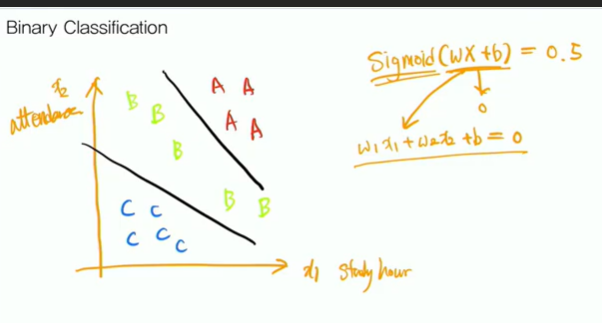

새로운 가설 Multinominal Classification

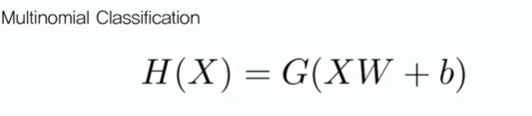

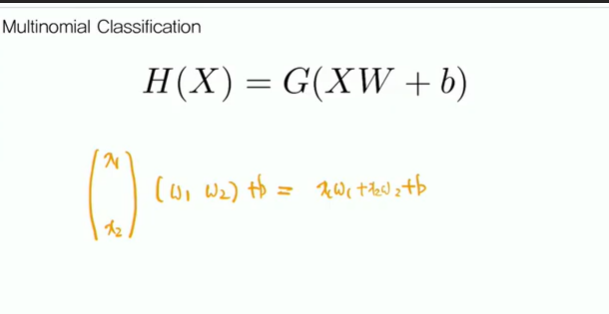

이것이 before

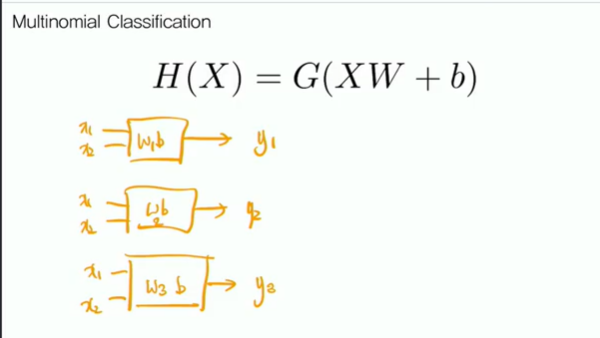

after이다. 각각 class에 대응하는 확률을 출력하길 원한다.
<br>확률의 특징
1. 0과 1사이의 값
2. 다 합치면 1이 된다. 

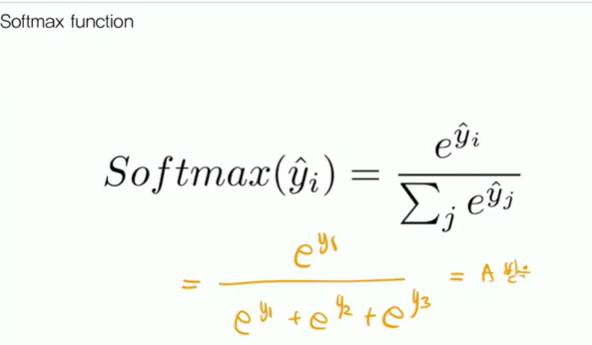

3가지 합을 합했다. continuous를 softmax로 표현

이러한 새로운 hypothesis에서 cost는?

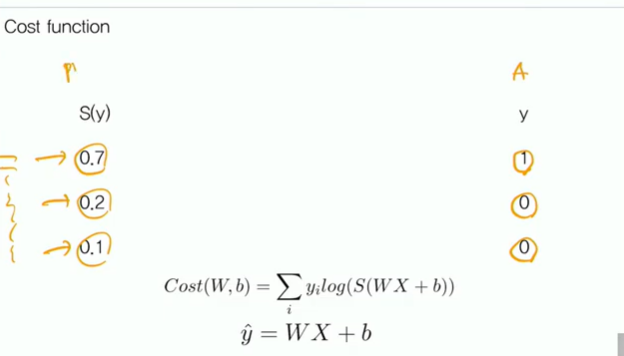

y는 정답 S(y)는 츨력(확률값)이다. 두 확률분포가 얼마나 다른지 그대로 가져와서 비교
<br>class가 여러개라서 sum을 한다. 


Binary는 2개 Multinominal은 softmax이다. 
<br>둘다 cross엔트로피의 개념에서 왔다. 

#Chapter7

Tran으로 학습을하고 Test로 시험을 본다. 
<br>시험을 보고 test 결과 기다리기가 귀찮아서 validation을 한다. 
<br>train과 validation을 나눈다. 
<br>validation loss가 증가 할 때 학습을 멈춘다.

(10000, 2)


Text(0.5, 1.0, 'Test Set Distribution')

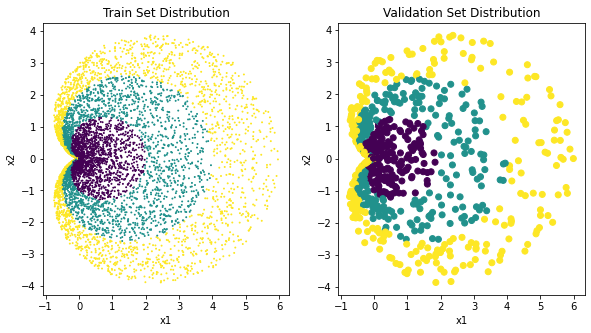

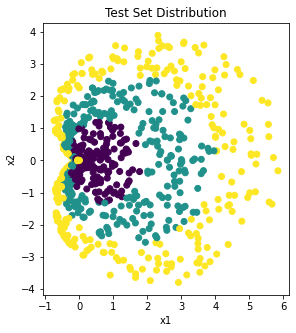

In [ ]:
#===============데이터 만들기
import numpy as np
import matplotlib.pyplot as plt
r = np. random.rand(10000) * 3 #0부터 3까지 랜덤으로 나옴
theta = np.random.rand(10000) * 2 * np.pi
y = r.astype(int) #r을 int형으로 바꾸기
r = r * (np.cos(theta) + 1)
x1 = r * np.cos(theta)
x2 = r * np.sin(theta)
X = np.array([x1, x2]).T 
print(X.shape) #10000개의 데이터 2개의 입력으로 만든다.


train_X, train_y = X[:8000, :], y[:8000]
val_X, val_y = X[8000:9000], y[8000:9000]
test_X, test_y = X[9000:, : ], y[9000:]

fig = plt.figure(figsize= (15, 5))
ax1 = fig.add_subplot(1, 3, 1)
ax1.scatter(train_X[:, 0], train_X[:, 1], c = train_y, s=0.9) #시퀀스별: For a sequence of values to be color-mapped, use the 'c' argument instead. s는 점의 크기이다. 그외) marker이용
ax1.set_xlabel('x1')
ax1.set_ylabel('x2')
ax1.set_title('Train Set Distribution')

ax2 = fig.add_subplot(1, 3, 2)
ax2.scatter(val_X[:, 0], val_X[:, 1], c = val_y, ) 
ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.set_title('Validation Set Distribution')

fig = plt.figure(figsize= (15, 5))
ax3 = fig.add_subplot(1, 3, 3)
ax3.scatter(test_X[:, 0], test_X[:, 1], c = test_y) 
ax3.set_xlabel('x1')
ax3.set_ylabel('x2')
ax3.set_title('Test Set Distribution')





input이 x1, x2이며 그래프는 3차원이다. 왜? 색깔이 출력이기 때문이다.  
입력 2개로 출력이 나온다.


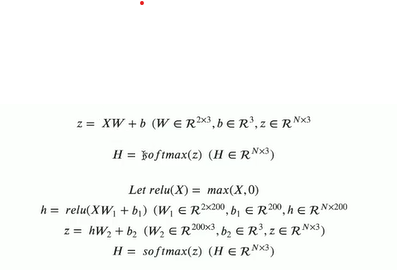

2차원의 input을 받고 logistic regression을 수행  
회귀를 이용하여 분류한다. 선형 연산을 통과후,   
로지스틱을 이용하여 분류를 수행  

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
class LinearModel(nn.Module):
  def __init__(self):
    super(LinearModel, self).__init__()
    self.linear1 = nn.Linear(2, 3, bias = True) #(input_features = 2, outputt_features = 3, bias = True)
    self.softmax = nn.Softmax()  
  def forward(self, x):
    x = self.linear1(x)
    return x

class MLPModel(nn.Module):
  def __init__(self):
    super(MLPModel, self).__init__()
    self.linear1 = nn.Linear(2, 200)
    self.linear2 = nn.Linear(200, 3)
    self.relu = nn.ReLU()

  def forward(self, x):
    x = self.linear1(x)
    x = self.relu(x)
    x = self.linear2(x)
    return x




In [ ]:
criterion = nn.CrossEntropyLoss()

test_pred_y = torch.Tensor([[1, 0], [0, 1]])
test_true_y1 = torch.Tensor([1, 0]).long()
test_true_y2 = torch.Tensor([0, 1]).long()


print(criterion(test_pred_y, test_true_y2))

tensor(0.3133)


크로스 엔트로피를 할 때,  
라벨에 해당하는 카테고리는 무조건! .long()을 해야한다. float는 반응 안한다.  
.long()은 무조건 텐서의 형태를 정수로 설정한다.  

Accuracy를 추가! 

9 prameters


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


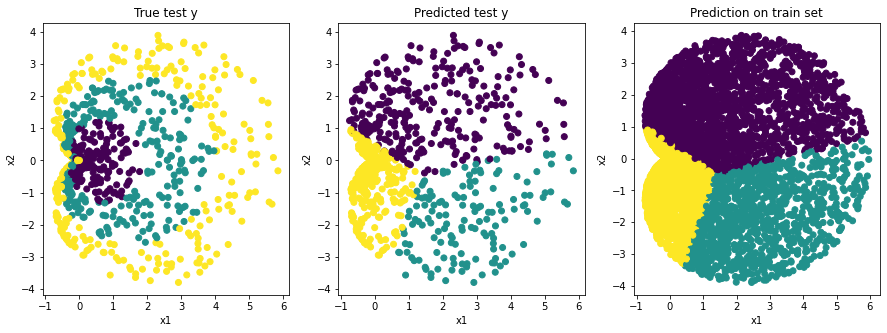

Epoch:  0 Accuracy:  35.4 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


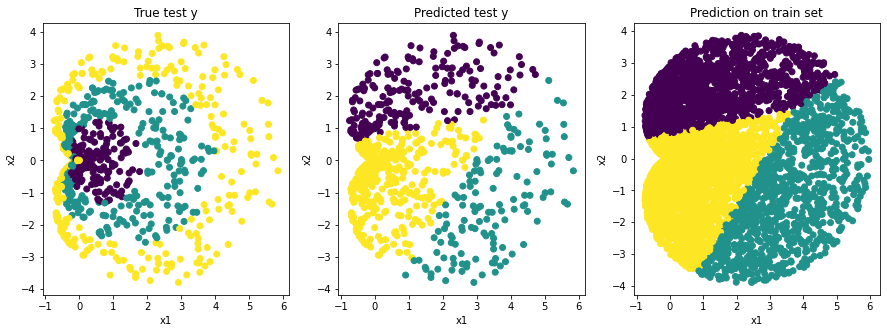

Epoch:  200 Accuracy:  36.199999999999996 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


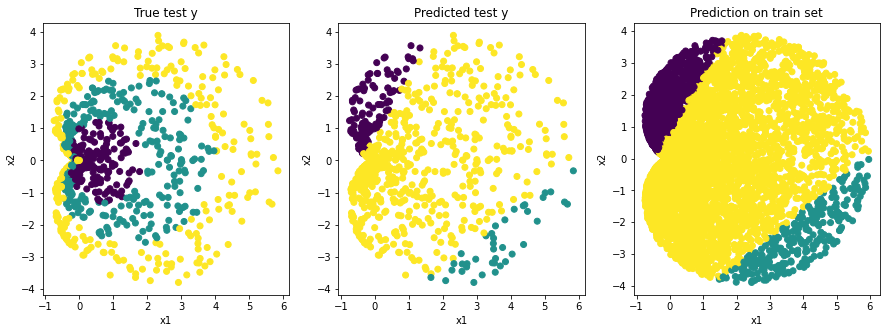

Epoch:  400 Accuracy:  35.199999999999996 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


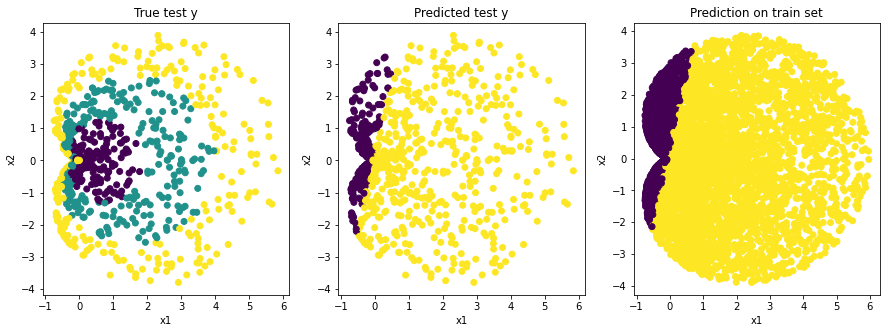

Epoch:  600 Accuracy:  32.5 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


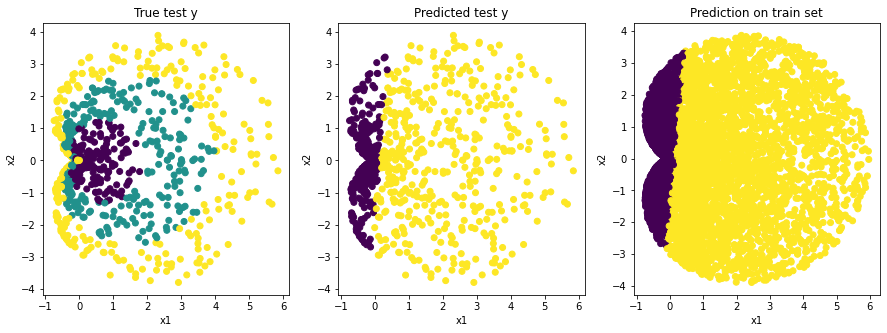

Epoch:  800 Accuracy:  30.5 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


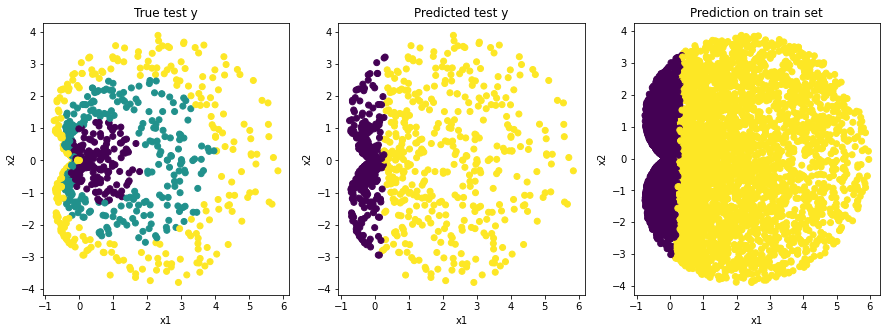

Epoch:  1000 Accuracy:  30.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


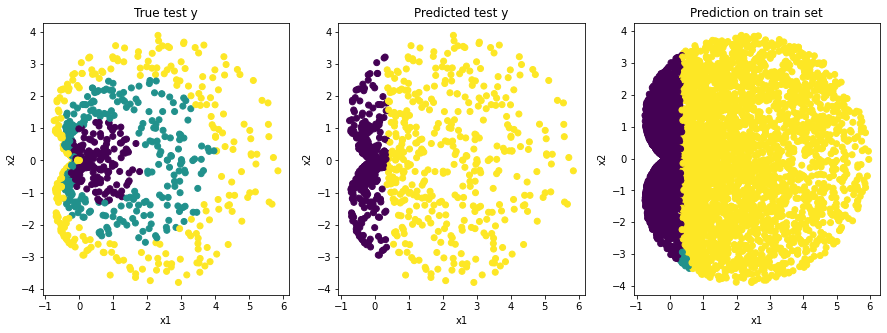

Epoch:  1200 Accuracy:  29.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


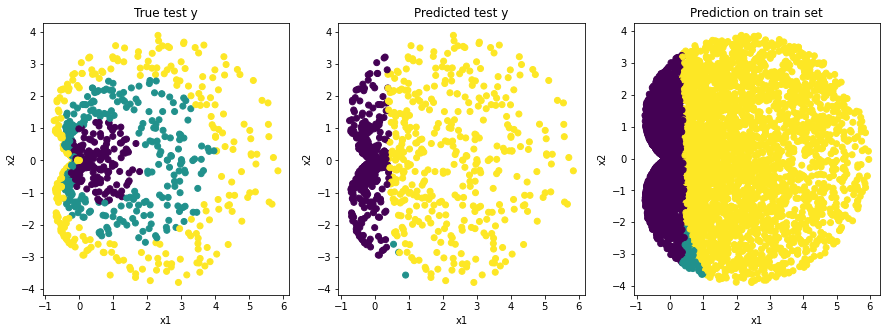

Epoch:  1400 Accuracy:  29.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


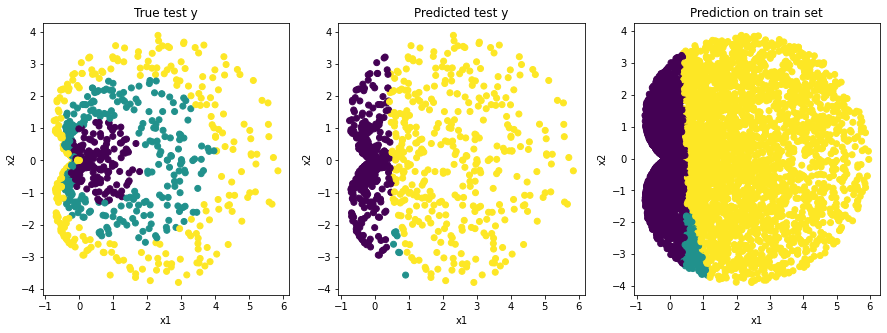

Epoch:  1600 Accuracy:  30.0 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


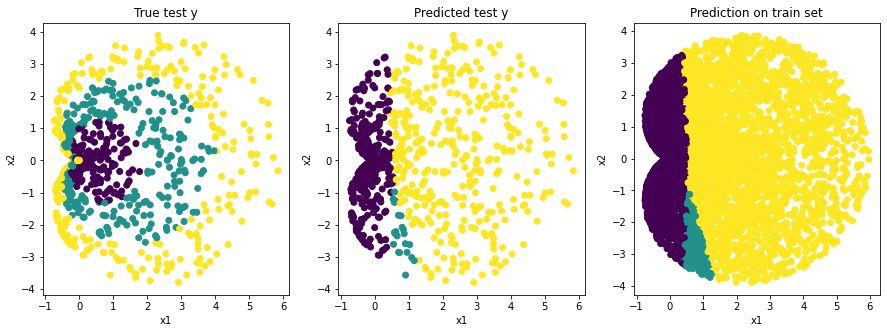

Epoch:  1800 Accuracy:  29.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


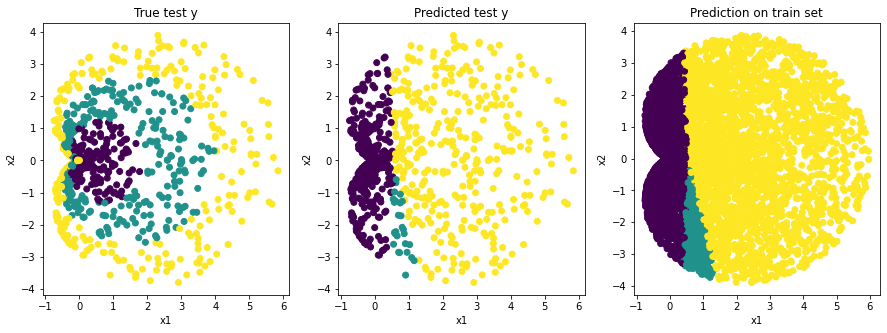

Epoch:  2000 Accuracy:  29.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


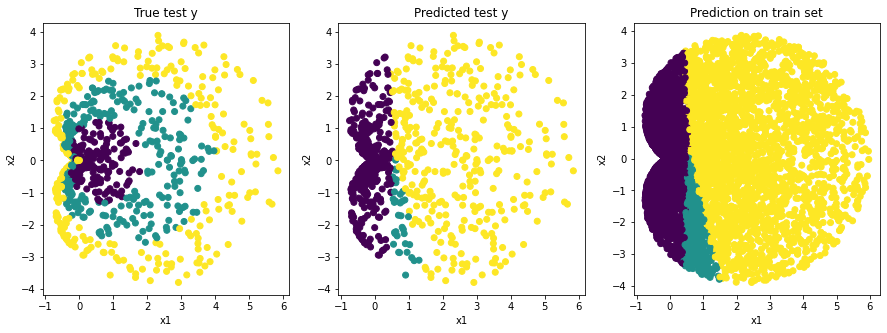

Epoch:  2200 Accuracy:  29.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


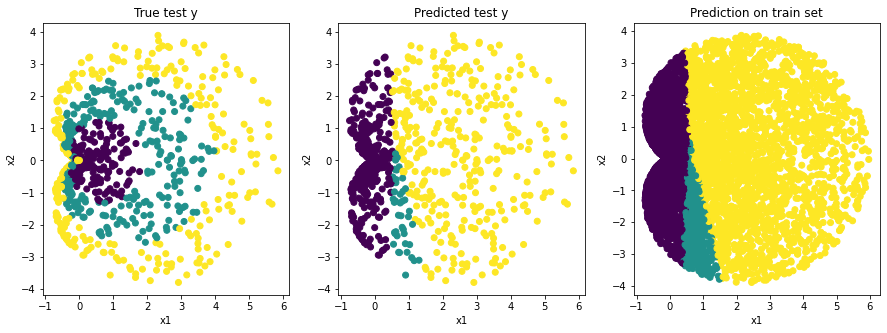

Epoch:  2400 Accuracy:  30.099999999999998 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


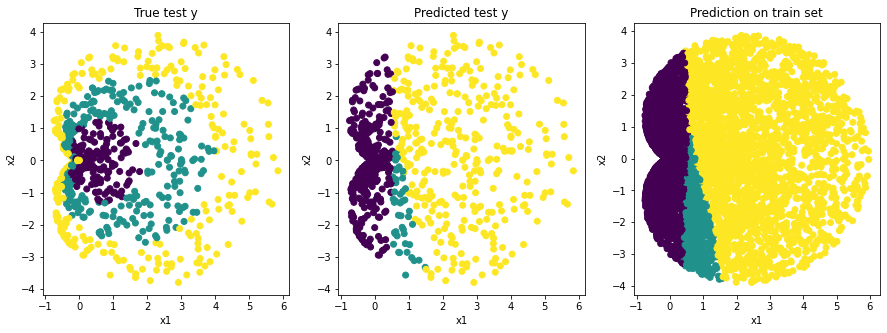

Epoch:  2600 Accuracy:  30.0 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


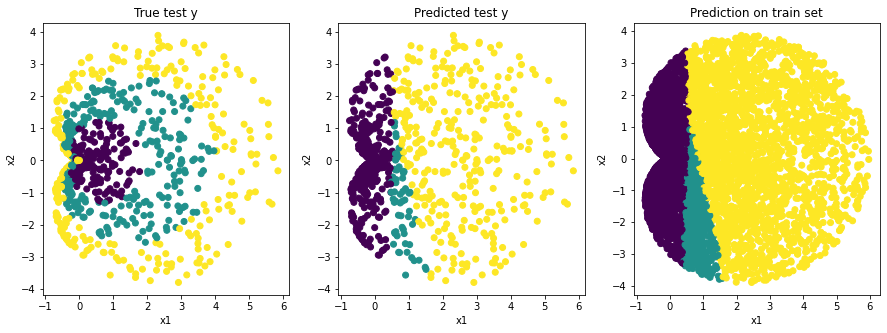

Epoch:  2800 Accuracy:  30.0 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


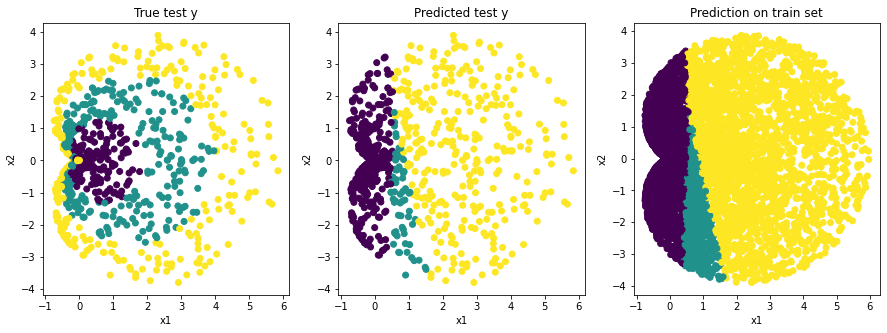

Epoch:  3000 Accuracy:  30.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


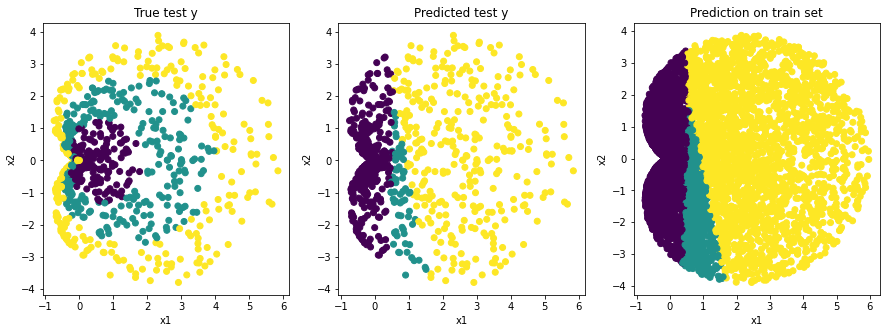

Epoch:  3200 Accuracy:  29.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


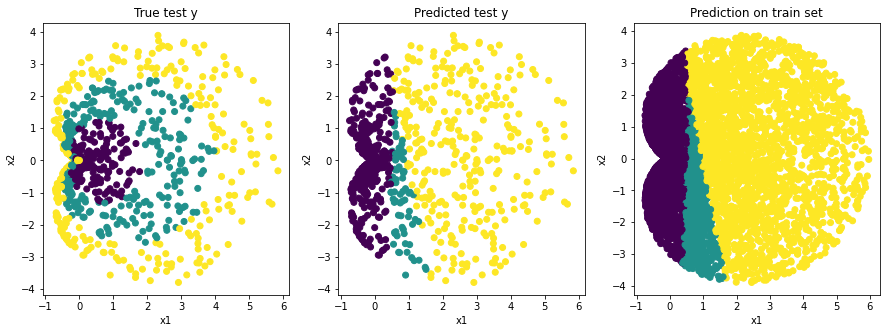

Epoch:  3400 Accuracy:  29.799999999999997 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


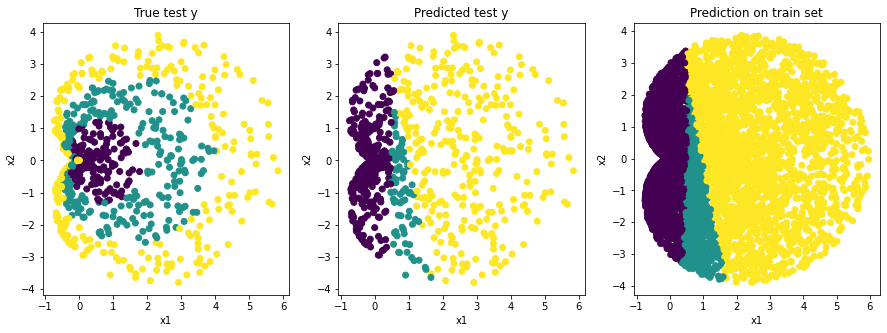

Epoch:  3600 Accuracy:  29.799999999999997 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


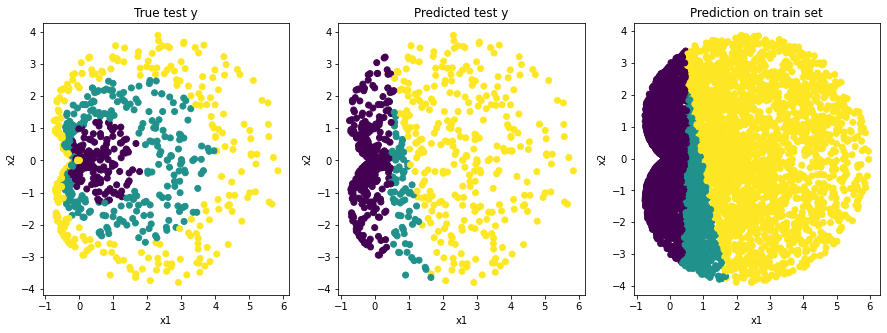

Epoch:  3800 Accuracy:  29.7 %


In [ ]:
import torch.optim as optim
from sklearn.metrics import accuracy_score
model = LinearModel()
print("{} prameters".format(sum(p.numel() for p in model.parameters() if p.requires_grad)))

#=============optimizer================
lr = 0.005
optimizer = optim.SGD(model.parameters(), lr = lr)

list_epoch = []
list_train_loss = [] 
list_val_loss = []
list_acc =[]
list_acc_epoch = []



epoch = 4000

for i in range(epoch):
#=============================학습=====
  model.train()
  optimizer.zero_grad()
  input_X = torch.Tensor(train_X)
  true_y = torch.Tensor(train_y).long()
  pred_y = model(input_X)
  loss = criterion(pred_y.squeeze(), true_y)
  loss.backward()
  optimizer.step()
  list_epoch.append(i)
  list_train_loss.append(loss.item())

#=============================검증====
  model.eval()
  optimizer.zero_grad()
  input_X = torch.Tensor(val_X)
  true_y = torch.Tensor(val_y).long()
  pred_y = model(input_X)
  loss = criterion(pred_y, true_y)
  list_val_loss.append(loss.detach().numpy())

#=============================시험====

  if i % 200 == 0:
    model.eval()
    optimizer.zero_grad()
    input_X = torch.Tensor(test_X)
    true_y = torch.tensor(true_y).long()
    predicted = model(input_X).detach().max(dim=1)[1].numpy()
    
    acc = accuracy_score(true_y, predicted) #sklearn에서는 (정답, 예측)으로 받는다. 
    list_acc.append(acc)
    list_acc_epoch.append(i)

    fig = plt.figure(figsize=(15,5))
        
    # ====== True Y Scattering ====== #
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.scatter(test_X[:, 0], test_X[:, 1], c=test_y)
    ax1.set_xlabel('x1')
    ax1.set_ylabel('x2')
    ax1.set_title('True test y')
        
    # ====== Predicted Y Scattering ====== #
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.scatter(test_X[:, 0], test_X[:, 1], c=predicted)
    ax2.set_xlabel('x1')
    ax2.set_ylabel('x2')
    ax2.set_title('Predicted test y')
        
    # ====== Just for Visualizaing with High Resolution ====== #
    input_x = torch.Tensor(train_X)
    predicted = model(input_x).detach().max(dim=1)[1].numpy() 
        
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.scatter(train_X[:, 0], train_X[:, 1], c=predicted)
    ax3.set_xlabel('x1')
    ax3.set_ylabel('x2')
    ax3.set_title('Prediction on train set')

    plt.show()
    print('Epoch: ', i,  'Accuracy: ', acc*100, '%')




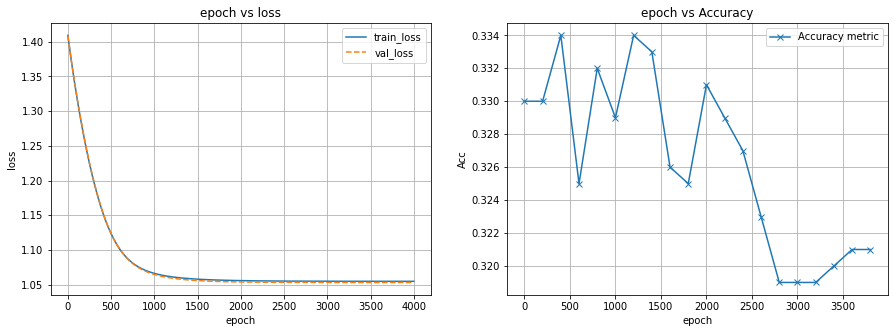

In [ ]:
fig = plt.figure(figsize=(15,5))

# ====== Loss Fluctuation ====== #
ax1 = fig.add_subplot(1, 2, 1)
ax1.plot(list_epoch, list_train_loss, label='train_loss')
ax1.plot(list_epoch, list_val_loss, '--', label='val_loss')
ax1.set_xlabel('epoch')
ax1.set_ylabel('loss')
ax1.grid()
ax1.legend()
ax1.set_title('epoch vs loss')

# ====== Metric Fluctuation ====== #
ax2 = fig.add_subplot(1, 2, 2)
ax2.plot(list_acc_epoch, list_acc, marker='x', label='Accuracy metric')
ax2.set_xlabel('epoch')
ax2.set_ylabel('Acc')
ax2.grid()
ax2.legend()
ax2.set_title('epoch vs Accuracy')

plt.show()

In [ ]:
list_epoch.clear()

9 prameters


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


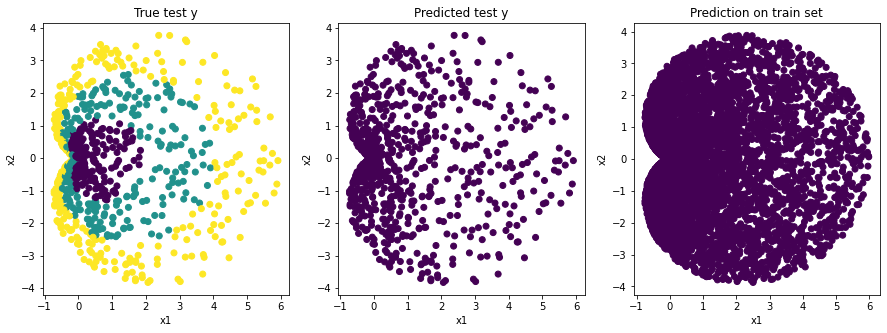

Epoch:  0 Accuracy:  32.7 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


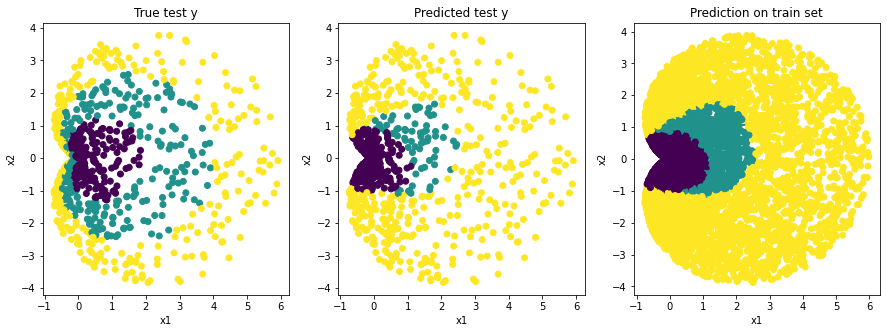

Epoch:  200 Accuracy:  34.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


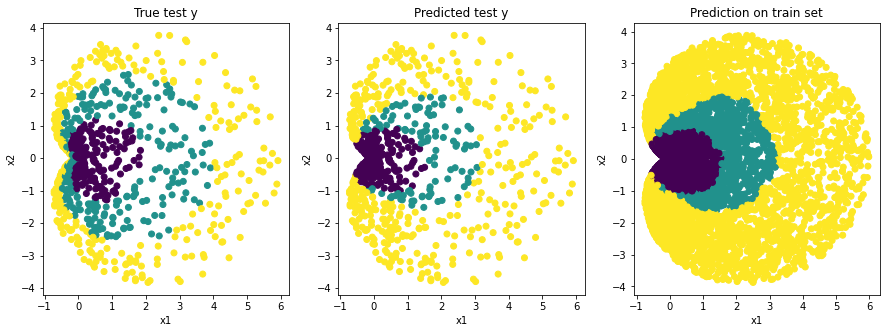

Epoch:  400 Accuracy:  34.4 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


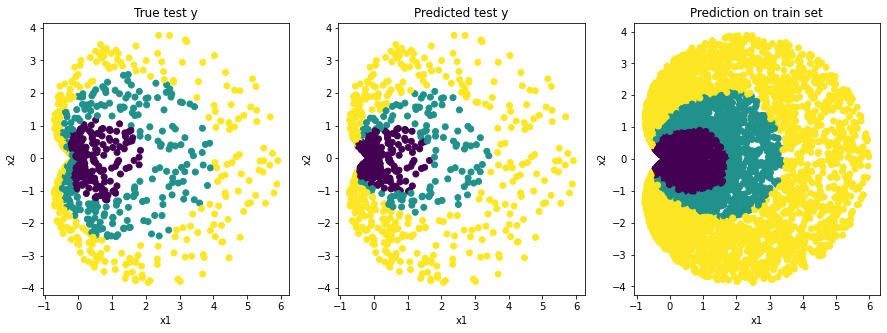

Epoch:  600 Accuracy:  34.9 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


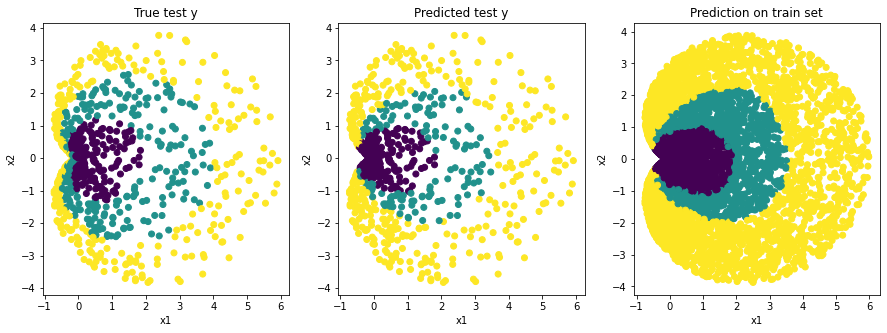

Epoch:  800 Accuracy:  35.0 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


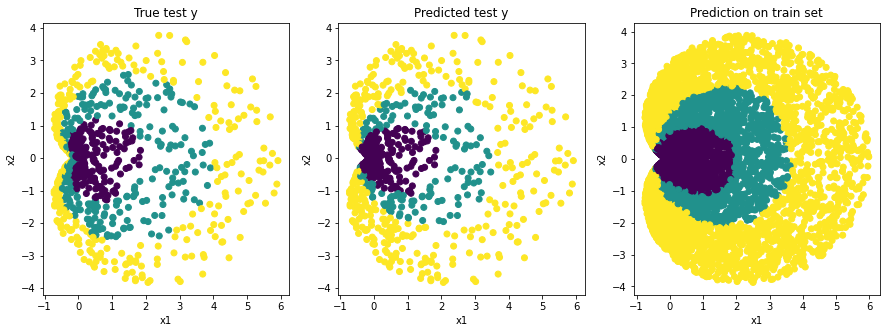

Epoch:  1000 Accuracy:  34.699999999999996 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


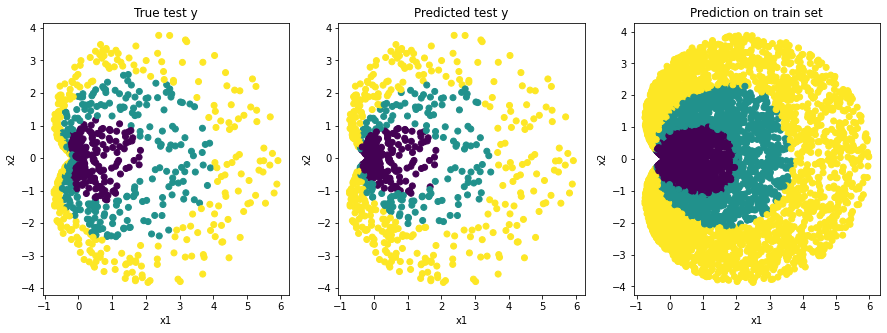

Epoch:  1200 Accuracy:  34.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


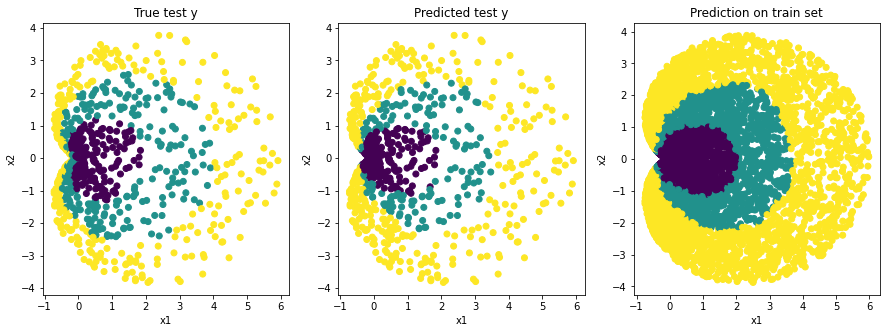

Epoch:  1400 Accuracy:  33.6 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


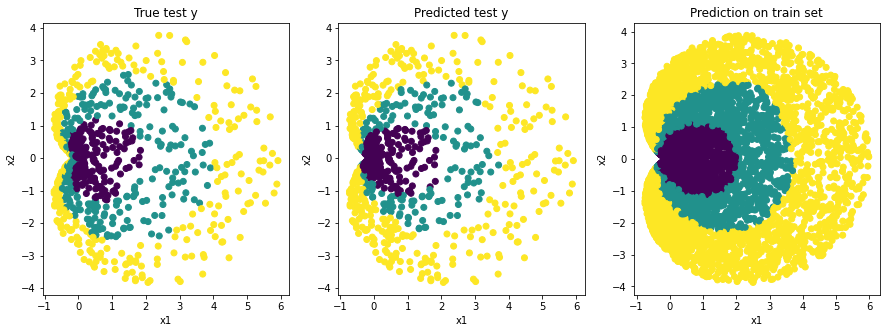

Epoch:  1600 Accuracy:  34.0 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


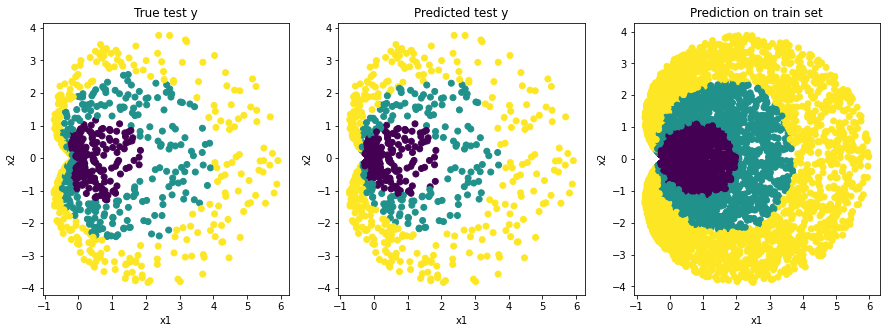

Epoch:  1800 Accuracy:  34.300000000000004 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


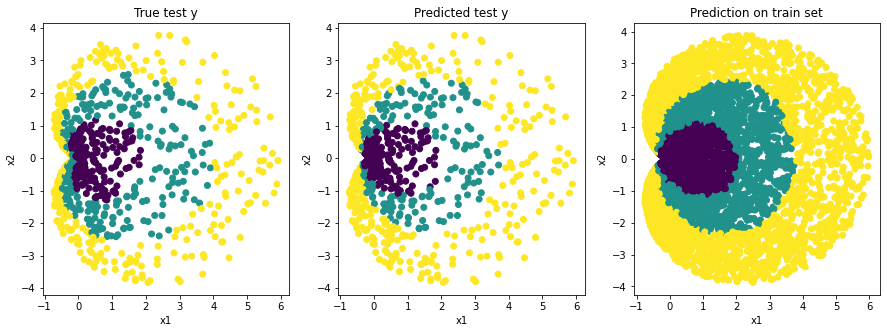

Epoch:  2000 Accuracy:  34.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


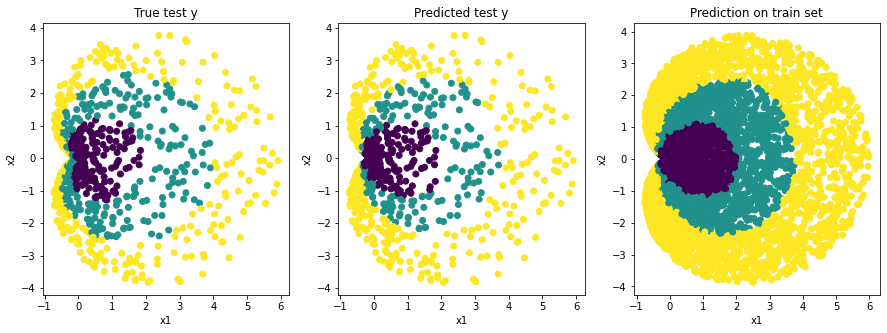

Epoch:  2200 Accuracy:  34.5 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


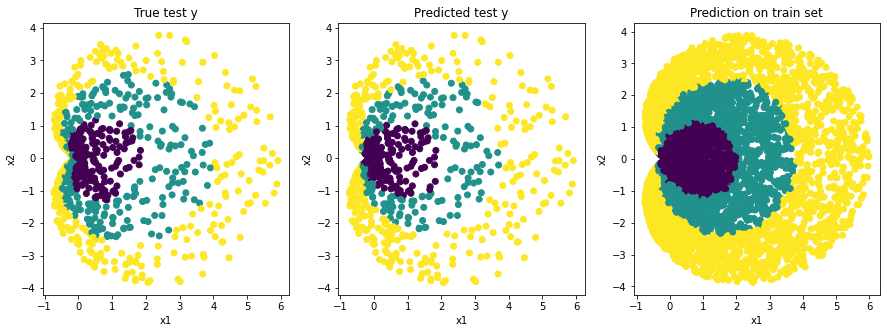

Epoch:  2400 Accuracy:  34.599999999999994 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


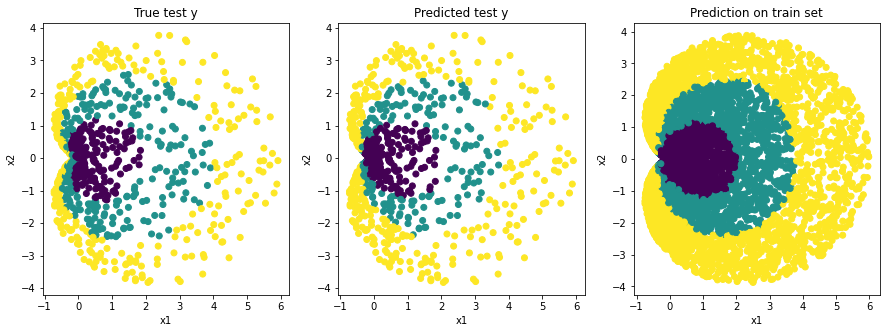

Epoch:  2600 Accuracy:  34.699999999999996 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


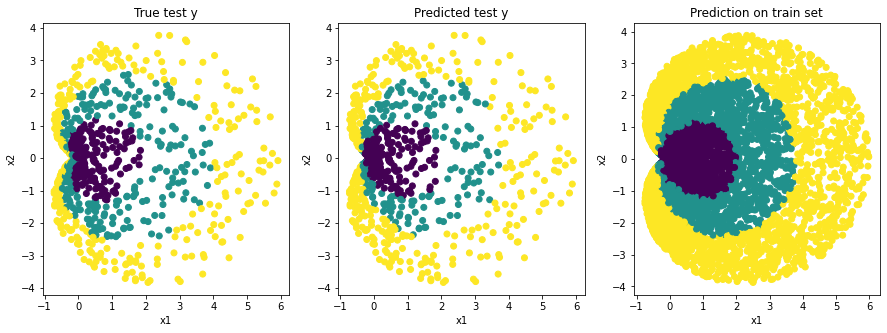

Epoch:  2800 Accuracy:  34.5 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


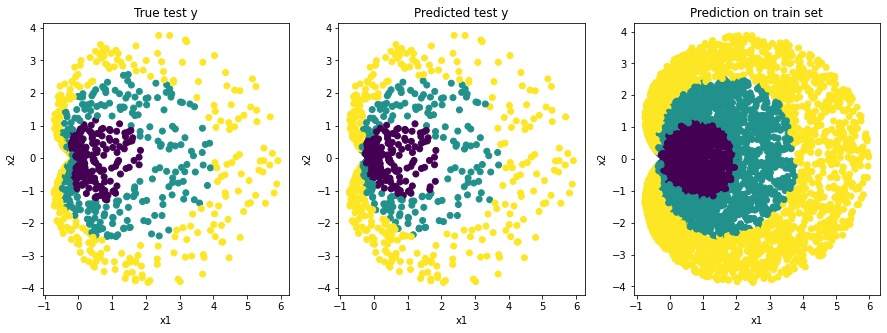

Epoch:  3000 Accuracy:  34.599999999999994 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


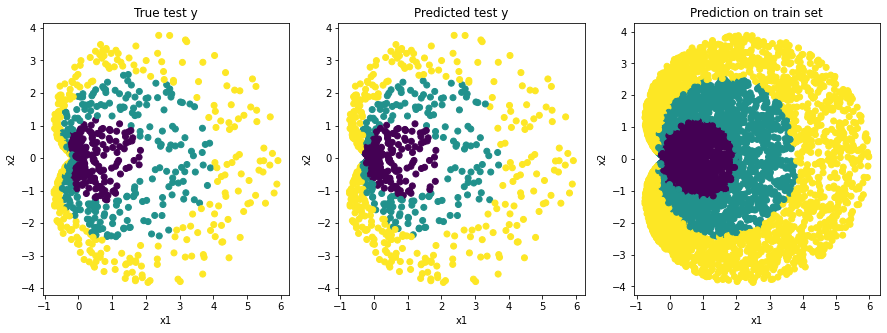

Epoch:  3200 Accuracy:  34.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


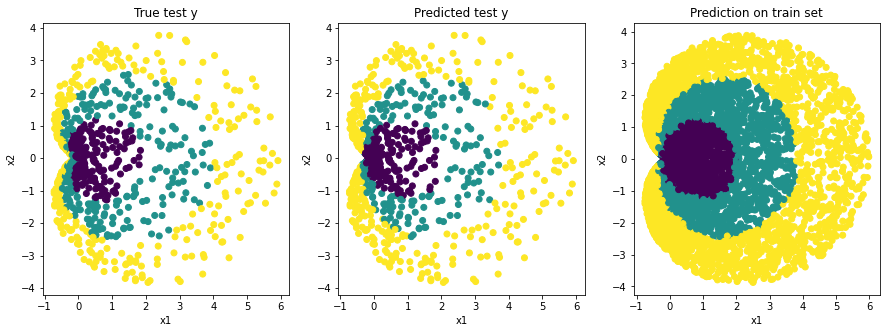

Epoch:  3400 Accuracy:  34.0 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


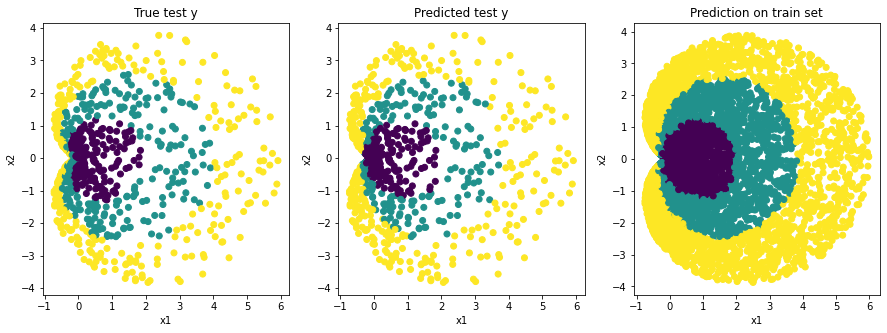

Epoch:  3600 Accuracy:  34.2 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


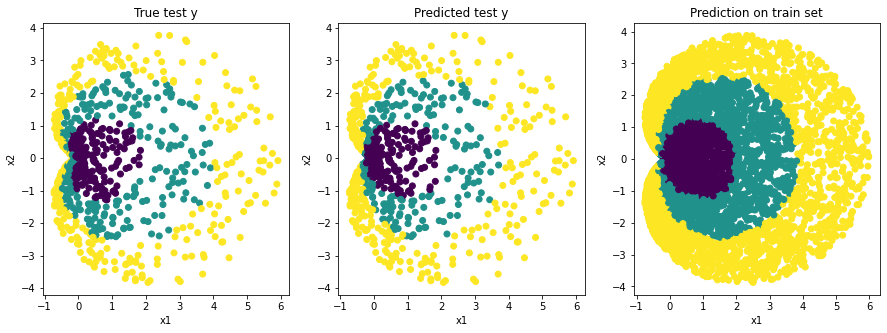

Epoch:  3800 Accuracy:  34.699999999999996 %


In [ ]:
#MLP사용 
import torch.optim as optim
from sklearn.metrics import accuracy_score
print("{} prameters".format(sum(p.numel() for p in model.parameters() if p.requires_grad)))
model = MLPModel()
#=============optimizer================
lr = 0.005
optimizer = optim.SGD(model.parameters(), lr = lr)


list_train_loss = [] 
list_val_loss = []
list_acc =[]
list_acc_epoch = []



epoch = 4000

for i in range(epoch):
#=============================학습=====
  model.train()
  optimizer.zero_grad()
  input_X = torch.Tensor(train_X)
  true_y = torch.Tensor(train_y).long()
  pred_y = model(input_X)
  loss = criterion(pred_y.squeeze(), true_y)
  loss.backward()
  optimizer.step()
  list_epoch.append(i)
  list_train_loss.append(loss.item())

#=============================검증====
  model.eval()
  optimizer.zero_grad()
  input_X = torch.Tensor(val_X)
  true_y = torch.Tensor(val_y).long()
  pred_y = model(input_X)
  loss = criterion(pred_y, true_y)
  list_val_loss.append(loss.detach().numpy())

#=============================시험====

  if i % 200 == 0:
    model.eval()
    optimizer.zero_grad()
    input_X = torch.Tensor(test_X)
    true_y = torch.tensor(true_y).long()
    predicted = model(input_X).detach().max(dim=1)[1].numpy() 
    acc = accuracy_score(true_y, predicted) #sklearn에서는 (정답, 예측)으로 받는다. 
    list_acc.append(acc)
    list_acc_epoch.append(i)

    fig = plt.figure(figsize=(15,5))
        
    # ====== True Y Scattering ====== #
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.scatter(test_X[:, 0], test_X[:, 1], c=test_y)
    ax1.set_xlabel('x1')
    ax1.set_ylabel('x2')
    ax1.set_title('True test y')
        
    # ====== Predicted Y Scattering ====== #
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.scatter(test_X[:, 0], test_X[:, 1], c=predicted)
    ax2.set_xlabel('x1')
    ax2.set_ylabel('x2')
    ax2.set_title('Predicted test y')
        
    # ====== Just for Visualizaing with High Resolution ====== #
    input_x = torch.Tensor(train_X)
    predicted = model(input_x).detach().max(dim=1)[1].numpy() 
        
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.scatter(train_X[:, 0], train_X[:, 1], c=predicted)
    ax3.set_xlabel('x1')
    ax3.set_ylabel('x2')
    ax3.set_title('Prediction on train set')

    plt.show()
    print('Epoch: ', i,  'Accuracy: ', acc*100, '%')


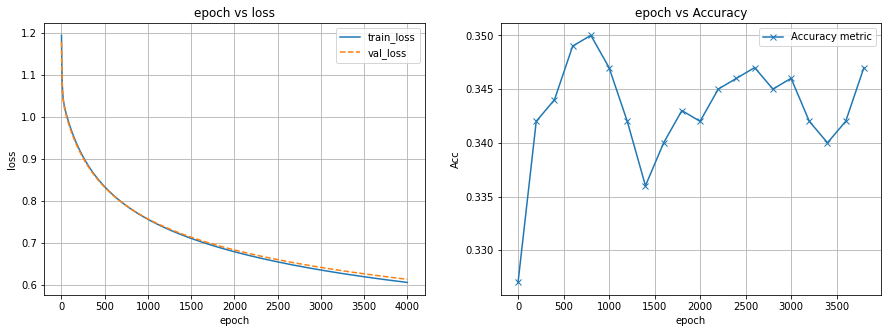

In [ ]:
fig = plt.figure(figsize=(15,5))

# ====== Loss Fluctuation ====== #
ax1 = fig.add_subplot(1, 2, 1)
ax1.plot(list_epoch, list_train_loss, label='train_loss')
ax1.plot(list_epoch, list_val_loss, '--', label='val_loss')
ax1.set_xlabel('epoch')
ax1.set_ylabel('loss')
ax1.grid()
ax1.legend()
ax1.set_title('epoch vs loss')

# ====== Metric Fluctuation ====== #
ax2 = fig.add_subplot(1, 2, 2)
ax2.plot(list_acc_epoch, list_acc, marker='x', label='Accuracy metric')
ax2.set_xlabel('epoch')
ax2.set_ylabel('Acc')
ax2.grid()
ax2.legend()
ax2.set_title('epoch vs Accuracy')

plt.show()

print('{} parameters'.format(sum(p.numel() for p in model.parameters() if p.requires_grad))) #모델의 파라미터수를 설정  
model.parameters() 괄호를 잊지말자  
loss = criterion(pred_y.squeeze(), true_y)  
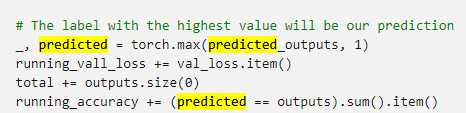   
accuracy를 정의하는 다른 방법     
.item()은 .detach().numpy()와 같다.   

In [ ]:
a = torch.Tensor([1])
f = a.item()
print(f)
print(type(f))

1.0
<class 'float'>


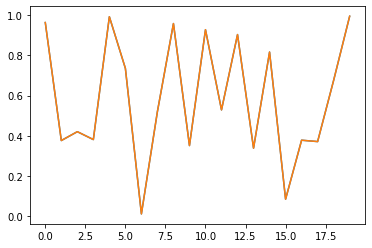

In [ ]:
import matplotlib.pyplot as plt
a = torch.rand(20)
b = np.arange(20)
plt.plot(b, a)

c = []
for A in a:
  c.append(A)

plt.plot(b, c)

.item()은 1개의 숫자만 들어갈 수 있으며, 텐서형태였던 숫자를 정수나 소수의 형태로 바꿔준다.

In [ ]:
import torch
a = torch.rand((3,10))
print("1:", a)
b, c = torch.max(a, dim =1)

print("2:", b)
print("3:", c)
print(type(b))
print("{:=^20}".format('다른 예제'))
for i in range(2): 
  e = a.detach().max(dim =1)[i].numpy()
  print("4:", e)
print(type(e))
print("{:=^20}".format('item에 관하여'))



1: tensor([[0.0708, 0.5396, 0.8022, 0.5535, 0.0230, 0.4688, 0.6386, 0.2429, 0.5325,
         0.9919],
        [0.0879, 0.7493, 0.5531, 0.6407, 0.2955, 0.1519, 0.3227, 0.3299, 0.2126,
         0.6907],
        [0.4859, 0.7412, 0.2747, 0.3751, 0.8405, 0.2224, 0.5557, 0.2537, 0.6253,
         0.7616]])
2: tensor([0.9919, 0.7493, 0.8405])
3: tensor([9, 1, 4])
<class 'torch.Tensor'>
=======다른 예제========
4: [0.9918942 0.7492508 0.8405106]
4: [9 1 4]
<class 'numpy.ndarray'>
=====item에 관하여======
1.0
<class 'float'>


torch.max(출력물, dim = 1)을 하면 행마다 최대값을 구한다.    
dim = 1 을  해야한다. 열의 크기중에서 제일 큰 값을 반환해야 하기 때문이다.        
(출력에서 행의 크기는 배치사이즈며, 열의 크기는 출력물의 클래스의 갯수만큼 나온다.)    

torch.max를 하면 최대값과 최대값의 인덱스가 나온다.   
type은 tensor이다.  



<br>출력물.detach().max(dim = 1)[i].numpy()의 경우
i = 0일때 최대값, i = 1일때 최대값의 인덱스를 반환한다.   
type은 numpy이다.   
연산에서 떼어낸다음 최대값구하고 numpy로 바꾼다고 생각하면 된다.    
보통 최대값보단, 최대값의 인덱스를 보는 편이다.    

